# Bladder Cancer

## Data processing

In [1]:
import numpy as np 
import pandas as pd
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt

import shap
import lime
import json
from lime.lime_tabular import LimeTabularExplainer


# data load
df_BCa = pd.read_csv('BCa_raw.csv') # 암 원본 데이터 중 diagnosis 탭 data
df_BCa['Age'].fillna(df_BCa['Age'].mean(), inplace=True)


In [2]:
# 독립변수와 종속변수 정의

X_nn3h = df_BCa[['CK8','CK18','PD-1','PD-L1','Gender','Age']]

# diagnosis의 Y값 ('Decision')
Y = df_BCa['Decision']

# Column name의 list
col_name_nn3h = ['CK8','CK18','PD-1','PD-L1','Gender','Age']

# 독립변수(X) DataFrame 리스트
X_sets = [X_nn3h]

# 각 X 데이터셋의 이름
X_dataset_names = ['X_nn3h']

# 종속변수(y) Series 리스트
Y_sets = [Y]

# Col name 리스트
col_name_sets = [col_name_nn3h]

sets_name = ['nn3h']

num_sets = len(X_sets)

In [3]:
# from sklearn.preprocessing import StandardScaler


# # 스케일링된 데이터셋을 저장할 새로운 리스트
# X_ss_sets = []

# for i in range(num_sets):
#     # 'Gender' column이 있는지 확인
#     if 'Gender' in X_sets[i].columns:
#         # Gender column 분리
#         gender_column = X_sets[i]['Gender']
        
#         # Gender column 제거한 나머지 column들에 대해 스케일링 진행
#         X_without_gender = X_sets[i].drop('Gender', axis=1)
        
#         scaler = StandardScaler()
#         X_standard_values = scaler.fit_transform(X_without_gender)
        
#         # 스케일링된 DataFrame 생성 
#         X_standard_df = pd.DataFrame(X_standard_values, columns=X_without_gender.columns)
        
#         # Gender column 다시 추가
#         X_standard_df['Gender'] = gender_column.values
        
#     else:
#         # 'Gender' 열이 없는 경우, 모든 열에 대해 스케일링 진행
#         scaler = StandardScaler()
#         X_standard_values = scaler.fit_transform(X_sets[i])
         
#         # 스케일링된 DataFrame 생성 
#         X_standard_df = pd.DataFrame(X_standard_values, columns=X_sets[i].columns)

#     X_ss_sets.append(X_standard_df)

#     print(f"Preprocessing completed for {X_dataset_names[i]}")


In [4]:
from sklearn.preprocessing import MinMaxScaler

# 스케일링된 데이터셋을 저장할 새로운 리스트
X_norm_sets = []

for i in range(num_sets):
    # 'Gender' column이 있는지 확인
    if 'Gender' in X_sets[i].columns:
        # Gender column 분리
        gender_column = X_sets[i]['Gender']
        
        # Gender column 제거한 나머지 column들에 대해 스케일링 진행
        X_without_gender = X_sets[i].drop('Gender', axis=1)
        
        scaler = MinMaxScaler()
        X_normalized_values = scaler.fit_transform(X_without_gender)
        
        # 스케일링된 DataFrame 생성 
        X_normalized_df = pd.DataFrame(X_normalized_values, columns=X_without_gender.columns)
        
        # Gender column 다시 추가
        X_normalized_df['Gender'] = gender_column.values
        
    else:
        # 'Gender' 열이 없는 경우, 모든 열에 대해 스케일링 진행
        scaler = MinMaxScaler()
        X_normalized_values = scaler.fit_transform(X_sets[i])
        # 스케일링된 DataFrame 생성 
        X_normalized_df = pd.DataFrame(X_normalized_values, columns=X_sets[i].columns)

    X_norm_sets.append(X_normalized_df)

    print(f"Preprocessing completed for {X_dataset_names[i]}")


Preprocessing completed for X_nn3h


## Model.fit & predict

### 1) Neural Network

In [5]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout,BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [6]:
# 교차 검증(StratifiedKFold cross-validation) 설정
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=2)


# 결과 저장용 dictionary 초기화
results_nn3h = {}

# proba_result_nn3h
proba_nn3h = []

# Thresholds 설정 (0.1부터 0.7까지 0.05 간격으로 sweep)
thresholds = np.arange(0.1, 0.7, 0.05)

# ROC curve와 AUC 계산을 위한 빈 리스트 생성
roc_auc_list_nn3h = [[[0]*len(thresholds) for a in range(skf.get_n_splits())] for b in range(num_sets)]
fpr_list_nn3h = [[[0]*len(thresholds) for a in range(skf.get_n_splits())] for b in range(num_sets)]
tpr_list_nn3h = [[[0]*len(thresholds) for a in range(skf.get_n_splits())] for b in range(num_sets)]

best_threshold = 0.5


for i in range(num_sets):
    cm_total_nn3h = [0]*len(thresholds)
    acc_total_nn3h = [0]*len(thresholds)
    prec_total_nn3h = [0]*len(thresholds)
    rec_total_nn3h = [0]*len(thresholds)
    f1_total_nn3h = [0]*len(thresholds)
    auc_total_nn3h = [0]*len(thresholds)
    
    for num in range(len(thresholds)):
        cm_total_nn3h.append(np.zeros((2,2)))
    
    for j, (train_index, test_index) in enumerate(skf.split(X_norm_sets[i], Y_sets[i])):
        # 모델 구조 설정 (각 반복마다 새로운 모델 생성)
        model = Sequential()
        model.add(Dense(1024, input_dim=X_norm_sets[i].shape[1], activation='relu'))  # 입력 차원을 해당 데이터셋에 맞게 설정
        
        model.add(BatchNormalization())
        model.add(Dense(512, activation='relu'))
        
        model.add(BatchNormalization())
        model.add(Dense(64,activation='relu'))
        model.add(Dense(1, activation='sigmoid'))

        # 모델 컴파일
        model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

        X_train_val, X_test_val = X_norm_sets[i].iloc[train_index], X_norm_sets[i].iloc[test_index]
        y_train_val, y_test_val= Y_sets[i].iloc[train_index], Y_sets[i].iloc[test_index]

        validation_ratio=0.2
        X_train,X_val,y_train,y_val=train_test_split(X_train_val,y_train_val,test_size=validation_ratio,stratify=y_train_val)

        early_stopping_callback=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20)
        checkpointer=tf.keras.callbacks.ModelCheckpoint(filepath=f"./nn3h_model_relu_2h/{X_dataset_names[i]}_fold{j+1}.hdf5",monitor='val_loss',verbose=0,save_best_only=True)
        history=model.fit(x=X_train,y=y_train,validation_data=(X_val,y_val),epochs=200,batch_size=32,callbacks=[early_stopping_callback,checkpointer],verbose=2)
        model.load_weights(f"./nn3h_model_relu_2h/{X_dataset_names[i]}_fold{j+1}.hdf5")   # 최적 모델 불러오기
        predictions_proba=model.predict(X_test_val).flatten()   # 예측 확률 생성
        fold_results = list(zip(test_index,predictions_proba))
        proba_nn3h.append(fold_results)
        predictions_xai = (predictions_proba > best_threshold).astype(int)
        
        # 예측과 실제값이 다른 index 추출
        misclassified_indices = np.where(predictions_xai != y_test_val)[0]
        misclassified_indices_test = test_index[predictions_xai != y_test_val]
        print('잘못 예측한 index 번호 list',misclassified_indices_test)
        
        def predict_proba(data):
            proba=model.predict(data)
            return np.hstack([1-proba,proba])
        
        for index, index_test in zip(misclassified_indices, misclassified_indices_test):
            if i==0:
                print(f"SHAP Force Plot for misclassified data point {index_test} in set {i+1}:")
                print('index #',index_test,'의 실제 정답은',Y_sets[0][index_test],'예측 결과는',predictions_proba[index])
            
                # SHAP force plot 그리기
                explainer_nn3h = shap.GradientExplainer(model,X_norm_sets[0].values)
                shap_values_nn3h = explainer_nn3h.shap_values(X_norm_sets[0].values)
                
                shap.initjs()
                
                expected_value = model.predict(X_norm_sets[0]).mean()
                # plt.figure()
                # Save SHAP force plot as an image file
                shap.force_plot(expected_value, shap_values_nn3h[0][index_test,:], X_norm_sets[0].iloc[index_test], show=False,matplotlib=True).savefig(f"nn3h_shap_plots/SHAP Force Plot for misclassified data point {index_test}.png")
                plt.close()

                # LIME table 그리기
                lime_explainer_nn3h = LimeTabularExplainer(X_norm_sets[0].to_numpy(), feature_names=X_norm_sets[0].columns.tolist(), class_names=['Not Decision', 'Decision'], verbose=True)
                lime_exp_nn3h = lime_explainer_nn3h.explain_instance(X_norm_sets[0].iloc[index_test], predict_proba)
                # lime_exp_1_nn3h.show_in_notebook()
                # Save LIME table as an image file
                lime_exp_nn3h.save_to_file(f"nn3h_lime_plots/LIME table for misclassified data point {index_test}.html")
        
        for idx, threshold in enumerate(thresholds):
            predictions=(predictions_proba>threshold).astype(int)   # 확률을 이진 레이블로 변환
            # roc_curve 함수로 FPR (False Positive Rate)과 TPR (True Positive Rate) 계산
            fpr, tpr, thre = roc_curve(y_test_val.values.astype(int), predictions_proba)
            # AUC 계산
            roc_auc = roc_auc_score(y_test_val.values.astype(int), predictions_proba)
            fpr_list_nn3h[i][j] = fpr
            tpr_list_nn3h[i][j] = tpr
            roc_auc_list_nn3h[i][j][idx] = roc_auc
            cm_total_nn3h[idx]+=confusion_matrix(y_test_val.values.astype(int),predictions)
            acc_total_nn3h[idx]+=accuracy_score(y_test_val.values.astype(int),predictions)
            prec_total_nn3h[idx]+=precision_score(y_test_val.values.astype(int),predictions)
            rec_total_nn3h[idx]+=recall_score(y_test_val.values.astype(int),predictions)
            f1_total_nn3h[idx]+=f1_score(y_test_val.values.astype(int), predictions)
            auc_total_nn3h[idx]+=roc_auc_score(y_test_val.values.astype(int), predictions_proba)

    if f"Model {i+1}" not in results_nn3h:
            results_nn3h[f"Model {i+1}"]={}
    
    for idx, threshold in enumerate(thresholds):
        results_nn3h[f"Model {i+1}"][threshold]={
            "Confusion Matrix": cm_total_nn3h[idx],
            "Accuracy": acc_total_nn3h[idx] / skf.get_n_splits(),
            "Precision": prec_total_nn3h[idx] / skf.get_n_splits(),
            "Recall": rec_total_nn3h[idx] / skf.get_n_splits(),
            "F1-Score": f1_total_nn3h[idx] / skf.get_n_splits(),
            "AUC": auc_total_nn3h[idx] / skf.get_n_splits()}

# Predict_proba값 index 순서대로 정렬 후 저장          
sorted_result_nn3h = [0]
df_proba_nn3h = [0]
proba_nn3h = np.concatenate(proba_nn3h)
sorted_result_nn3h = proba_nn3h[proba_nn3h[:, 0].argsort()]
df_proba_nn3h = pd.DataFrame(sorted_result_nn3h[:,1], columns=['Predictor value'])
    
# csv로 저장
df_proba_nn3h.to_csv('Predictor value nn3h.csv', index=False)


Epoch 1/200
2/2 - 1s - loss: 0.7708 - accuracy: 0.6154 - val_loss: 0.6715 - val_accuracy: 0.6429
Epoch 2/200
2/2 - 0s - loss: 0.4405 - accuracy: 0.8462 - val_loss: 0.6668 - val_accuracy: 0.6429
Epoch 3/200
2/2 - 0s - loss: 0.4183 - accuracy: 0.8077 - val_loss: 0.6627 - val_accuracy: 0.6429
Epoch 4/200
2/2 - 0s - loss: 0.2883 - accuracy: 0.8654 - val_loss: 0.6544 - val_accuracy: 0.6429
Epoch 5/200
2/2 - 0s - loss: 0.2874 - accuracy: 0.8654 - val_loss: 0.6482 - val_accuracy: 0.6429
Epoch 6/200
2/2 - 0s - loss: 0.3017 - accuracy: 0.8654 - val_loss: 0.6464 - val_accuracy: 0.6429
Epoch 7/200
2/2 - 0s - loss: 0.2942 - accuracy: 0.8654 - val_loss: 0.6463 - val_accuracy: 0.6429
Epoch 8/200
2/2 - 0s - loss: 0.2252 - accuracy: 0.9423 - val_loss: 0.6457 - val_accuracy: 0.6429
Epoch 9/200
2/2 - 0s - loss: 0.2406 - accuracy: 0.8654 - val_loss: 0.6448 - val_accuracy: 0.6429
Epoch 10/200
2/2 - 0s - loss: 0.2845 - accuracy: 0.8846 - val_loss: 0.6428 - val_accuracy: 0.6429
Epoch 11/200
2/2 - 0s - loss:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.8198468402073794
Prediction_local [0.62554086]
Right: 0.6083365
SHAP Force Plot for misclassified data point 60 in set 1:
index # 60 의 실제 정답은 0 예측 결과는 0.60730344


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.818963798911074
Prediction_local [0.6336083]
Right: 0.60730344
SHAP Force Plot for misclassified data point 63 in set 1:
index # 63 의 실제 정답은 0 예측 결과는 0.7237674


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.6867684863243861
Prediction_local [0.75629768]
Right: 0.7237674
SHAP Force Plot for misclassified data point 67 in set 1:
index # 67 의 실제 정답은 0 예측 결과는 0.81268716


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.6657993511427049
Prediction_local [0.80930293]
Right: 0.81268716
SHAP Force Plot for misclassified data point 70 in set 1:
index # 70 의 실제 정답은 0 예측 결과는 0.723848


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.6889275419864321
Prediction_local [0.75412707]
Right: 0.723848
SHAP Force Plot for misclassified data point 78 in set 1:
index # 78 의 실제 정답은 0 예측 결과는 0.7910488


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.6721566325969794
Prediction_local [0.79706661]
Right: 0.7910489
Epoch 1/200
2/2 - 1s - loss: 0.7798 - accuracy: 0.6923 - val_loss: 0.6516 - val_accuracy: 0.6429
Epoch 2/200
2/2 - 0s - loss: 0.3676 - accuracy: 0.8462 - val_loss: 0.6358 - val_accuracy: 0.6429
Epoch 3/200
2/2 - 0s - loss: 0.3650 - accuracy: 0.7692 - val_loss: 0.6242 - val_accuracy: 0.6429
Epoch 4/200
2/2 - 0s - loss: 0.2437 - accuracy: 0.8846 - val_loss: 0.6144 - val_accuracy: 0.6429
Epoch 5/200
2/2 - 0s - loss: 0.2196 - accuracy: 0.9038 - val_loss: 0.6073 - val_accuracy: 0.6429
Epoch 6/200
2/2 - 0s - loss: 0.2047 - accuracy: 0.9423 - val_loss: 0.6012 - val_accuracy: 0.6429
Epoch 7/200
2/2 - 0s - loss: 0.1797 - accuracy: 0.9423 - val_loss: 0.5986 - val_accuracy: 0.6429
Epoch 8/200
2/2 - 0s - loss: 0.1816 - accuracy: 0.9423 - val_loss: 0.5952 - val_accuracy: 0.6429
Epoch 9/200
2/2 - 0s - loss: 0.1934 - accuracy: 0.8846 - val_loss: 0.5941 - val_accuracy: 0.6429
Epoch 10/200
2/2 - 0s - loss: 0.1896 - accuracy: 0.

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.7977725711135839
Prediction_local [0.57706093]
Right: 0.42365533
SHAP Force Plot for misclassified data point 72 in set 1:
index # 72 의 실제 정답은 0 예측 결과는 0.784762


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.5152944798735793
Prediction_local [0.827536]
Right: 0.784762
SHAP Force Plot for misclassified data point 74 in set 1:
index # 74 의 실제 정답은 0 예측 결과는 0.72210115


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.5482583363561173
Prediction_local [0.73051193]
Right: 0.7221012
SHAP Force Plot for misclassified data point 82 in set 1:
index # 82 의 실제 정답은 0 예측 결과는 0.83504987


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.5227834252945052
Prediction_local [0.79690388]
Right: 0.83504987
Epoch 1/200
2/2 - 1s - loss: 0.6149 - accuracy: 0.6923 - val_loss: 0.6562 - val_accuracy: 0.6429
Epoch 2/200
2/2 - 0s - loss: 0.5984 - accuracy: 0.8462 - val_loss: 0.6588 - val_accuracy: 0.6429
Epoch 3/200
2/2 - 0s - loss: 0.3371 - accuracy: 0.8846 - val_loss: 0.6516 - val_accuracy: 0.6429
Epoch 4/200
2/2 - 0s - loss: 0.2460 - accuracy: 0.9038 - val_loss: 0.6435 - val_accuracy: 0.6429
Epoch 5/200
2/2 - 0s - loss: 0.2033 - accuracy: 0.9231 - val_loss: 0.6372 - val_accuracy: 0.6429
Epoch 6/200
2/2 - 0s - loss: 0.2749 - accuracy: 0.8846 - val_loss: 0.6379 - val_accuracy: 0.6429
Epoch 7/200
2/2 - 0s - loss: 0.1950 - accuracy: 0.9231 - val_loss: 0.6442 - val_accuracy: 0.6429
Epoch 8/200
2/2 - 0s - loss: 0.1622 - accuracy: 0.9615 - val_loss: 0.6459 - val_accuracy: 0.6429
Epoch 9/200
2/2 - 0s - loss: 0.2327 - accuracy: 0.8846 - val_loss: 0.6444 - val_accuracy: 0.6429
Epoch 10/200
2/2 - 0s - loss: 0.1913 - accuracy: 0

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.6407430344071874
Prediction_local [0.503698]
Right: 0.490886
SHAP Force Plot for misclassified data point 55 in set 1:
index # 55 의 실제 정답은 0 예측 결과는 0.52263886


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.6293297728613263
Prediction_local [0.53411517]
Right: 0.52263886
SHAP Force Plot for misclassified data point 61 in set 1:
index # 61 의 실제 정답은 0 예측 결과는 0.5042396


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.6346216315060395
Prediction_local [0.5196322]
Right: 0.5042396
SHAP Force Plot for misclassified data point 65 in set 1:
index # 65 의 실제 정답은 0 예측 결과는 0.61808115


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.5325598237444491
Prediction_local [0.61743714]
Right: 0.61808115
SHAP Force Plot for misclassified data point 66 in set 1:
index # 66 의 실제 정답은 0 예측 결과는 0.607115


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.5408331035263464
Prediction_local [0.5999168]
Right: 0.607115
SHAP Force Plot for misclassified data point 73 in set 1:
index # 73 의 실제 정답은 0 예측 결과는 0.6242179


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.5305867327906205
Prediction_local [0.62887133]
Right: 0.6242179
SHAP Force Plot for misclassified data point 81 in set 1:
index # 81 의 실제 정답은 0 예측 결과는 0.51503456


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.6322533066331328
Prediction_local [0.52564316]
Right: 0.51503456
Epoch 1/200
2/2 - 1s - loss: 0.7866 - accuracy: 0.5849 - val_loss: 0.6630 - val_accuracy: 0.6429
Epoch 2/200
2/2 - 0s - loss: 0.5629 - accuracy: 0.8113 - val_loss: 0.6520 - val_accuracy: 0.6429
Epoch 3/200
2/2 - 0s - loss: 0.3717 - accuracy: 0.8679 - val_loss: 0.6444 - val_accuracy: 0.6429
Epoch 4/200
2/2 - 0s - loss: 0.3491 - accuracy: 0.8113 - val_loss: 0.6396 - val_accuracy: 0.6429
Epoch 5/200
2/2 - 0s - loss: 0.2825 - accuracy: 0.8679 - val_loss: 0.6358 - val_accuracy: 0.6429
Epoch 6/200
2/2 - 0s - loss: 0.3400 - accuracy: 0.8491 - val_loss: 0.6344 - val_accuracy: 0.6429
Epoch 7/200
2/2 - 0s - loss: 0.3498 - accuracy: 0.8113 - val_loss: 0.6337 - val_accuracy: 0.6429
Epoch 8/200
2/2 - 0s - loss: 0.2681 - accuracy: 0.8679 - val_loss: 0.6335 - val_accuracy: 0.6429
Epoch 9/200
2/2 - 0s - loss: 0.2502 - accuracy: 0.8679 - val_loss: 0.6330 - val_accuracy: 0.6429
Epoch 10/200
2/2 - 0s - loss: 0.2116 - accuracy: 0

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.5292959817783751
Prediction_local [0.57830448]
Right: 0.5915327
SHAP Force Plot for misclassified data point 64 in set 1:
index # 64 의 실제 정답은 0 예측 결과는 0.56665164


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.5308517604618307
Prediction_local [0.57343521]
Right: 0.56665164
SHAP Force Plot for misclassified data point 71 in set 1:
index # 71 의 실제 정답은 0 예측 결과는 0.51294345


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.5977764090588507
Prediction_local [0.51582095]
Right: 0.51294345
SHAP Force Plot for misclassified data point 79 in set 1:
index # 79 의 실제 정답은 0 예측 결과는 0.5224697


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.5976397130864091
Prediction_local [0.52040503]
Right: 0.5224697
Epoch 1/200
2/2 - 1s - loss: 1.1178 - accuracy: 0.5660 - val_loss: 0.6583 - val_accuracy: 0.6429
Epoch 2/200
2/2 - 0s - loss: 0.7010 - accuracy: 0.7547 - val_loss: 0.6437 - val_accuracy: 0.6429
Epoch 3/200
2/2 - 0s - loss: 0.4927 - accuracy: 0.7170 - val_loss: 0.6374 - val_accuracy: 0.6429
Epoch 4/200
2/2 - 0s - loss: 0.4140 - accuracy: 0.7736 - val_loss: 0.6349 - val_accuracy: 0.6429
Epoch 5/200
2/2 - 0s - loss: 0.3597 - accuracy: 0.8302 - val_loss: 0.6323 - val_accuracy: 0.6429
Epoch 6/200
2/2 - 0s - loss: 0.3906 - accuracy: 0.7925 - val_loss: 0.6274 - val_accuracy: 0.6429
Epoch 7/200
2/2 - 0s - loss: 0.3198 - accuracy: 0.8491 - val_loss: 0.6212 - val_accuracy: 0.6429
Epoch 8/200
2/2 - 0s - loss: 0.3545 - accuracy: 0.8113 - val_loss: 0.6170 - val_accuracy: 0.6429
Epoch 9/200
2/2 - 0s - loss: 0.3280 - accuracy: 0.8302 - val_loss: 0.6159 - val_accuracy: 0.6429
Epoch 10/200
2/2 - 0s - loss: 0.3207 - accuracy: 0.

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.6623784180281335
Prediction_local [0.53018414]
Right: 0.5440664
SHAP Force Plot for misclassified data point 54 in set 1:
index # 54 의 실제 정답은 0 예측 결과는 0.55423486


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.6497783958556226
Prediction_local [0.56221931]
Right: 0.55423486
SHAP Force Plot for misclassified data point 56 in set 1:
index # 56 의 실제 정답은 0 예측 결과는 0.5931375


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.6430055959265815
Prediction_local [0.58685293]
Right: 0.5931375
SHAP Force Plot for misclassified data point 69 in set 1:
index # 69 의 실제 정답은 0 예측 결과는 0.60743713


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.5977264346909178
Prediction_local [0.60406989]
Right: 0.60743713
SHAP Force Plot for misclassified data point 76 in set 1:
index # 76 의 실제 정답은 0 예측 결과는 0.57036936


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.6461618380965233
Prediction_local [0.57739969]
Right: 0.57036936
SHAP Force Plot for misclassified data point 80 in set 1:
index # 80 의 실제 정답은 0 예측 결과는 0.59557223


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


Intercept 0.6351506843162616
Prediction_local [0.61313675]
Right: 0.59557223


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


SHAP Summary Plot for set 1:


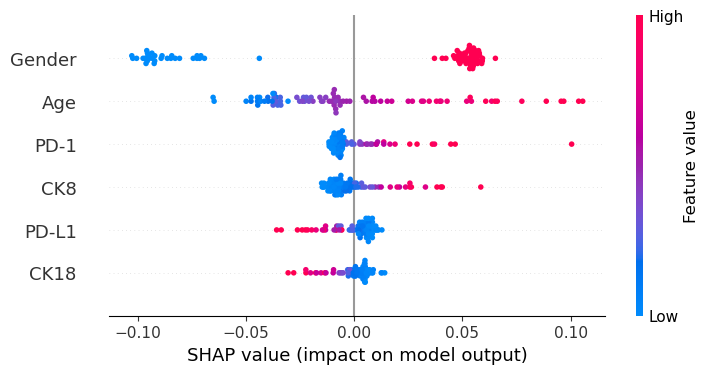

In [7]:
shap.initjs()

best_threshold_nn3h = 0.5

for i in range(num_sets):
    X = X_norm_sets[i]
    Y = Y_sets[i]

    # 해당 인덱스의 모델 선택
    model = Sequential()
    model.add(Dense(1024, input_dim=X_norm_sets[i].shape[1], activation='relu'))  # 입력 차원을 해당 데이터셋에 맞게 설정
    model.add(BatchNormalization())
    model.add(Dense(512, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dense(64,activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    
    shap_values_nn3h_accumulator = np.zeros((X.shape[0], X.shape[1]))

    for j in range(5):
        model.load_weights(f"./nn3h_model_relu_2h/{X_dataset_names[i]}_fold{j+1}.hdf5")   # 최적 모델 불러오기
        model.compile(optimizer='adam', loss='binary_crossentropy')

        
        def predict_proba(data):
            proba=model.predict(data)
            return np.hstack([1-proba,proba])

        explainer_summary_nn3h = shap.GradientExplainer(model,X.values) 
        shap_values_summary_nn3h = explainer_summary_nn3h.shap_values(X.values)
        
        # Compute the expected value
        expected_value = model.predict(X).mean() 

        # Accumulate SHAP values
        shap_values_nn3h_accumulator += np.array(shap_values_summary_nn3h[0])

    # Average the accumulated SHAP values
    shap_values_nn3h_average = shap_values_nn3h_accumulator / 5.0

    print(f"SHAP Summary Plot for set {i+1}:")
    
    # Use the average SHAP values for the summary plot
    shap.summary_plot(shap_values_nn3h_average, X)

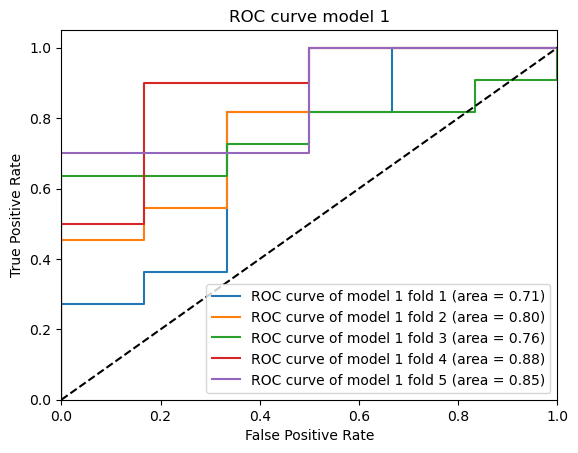

In [8]:
from sklearn.metrics import roc_curve, auc

i = 0  # 첫번째 모델 선택

# Fold 별로 반복
for j in range(skf.get_n_splits()):

    # 실제 레이블과 예측 확률을 기반으로 FPR, TPR 계산
    fpr = np.array(fpr_list_nn3h[i][j]).flatten()
    tpr = np.array(tpr_list_nn3h[i][j]).flatten()
    
    # AUC 계산
    roc_auc = auc(fpr, tpr)

    # ROC curve 그리기
    plt.plot(fpr, tpr, label=f'ROC curve of model {i+1} fold {j+1} (area = {roc_auc:0.2f})')
# 대각선 추가 (random classifier)
plt.plot([0, 1], [0, 1], 'k--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve model 1')
plt.legend(loc="lower right")

# Plot 표시
plt.show()


In [9]:
# 데이터프레임 생성을 위한 빈 리스트 초기화
data_metrics_nn3h = []

# results_nn3h 딕셔너리의 내용을 데이터프레임에 추가
for model, thresholds in results_nn3h.items():
    for threshold in thresholds:
        if threshold in thresholds:
            metrics = thresholds[threshold]
            accuracy = metrics['Accuracy']
            precision = metrics['Precision']
            recall = metrics['Recall']
            f1_score = metrics['F1-Score']
            auc = metrics['AUC']
        else:
            accuracy = None
            precision = None
            recall = None
            f1_score = None
            auc = None
            
        data_metrics_nn3h.append([model, threshold, accuracy, precision, recall, f1_score, auc])

# 데이터프레임 생성
df_metrics_nn3h = pd.DataFrame(data_metrics_nn3h, columns=['Model', 'Threshold', 'Accuracy', 'Precision', 'Recall', 'F1-Score','AUC'])

df_metrics_nn3h

,Model,Threshold,Accuracy,Precision,Recall,F1-Score,AUC
0,Model 1,0.10,0.638235,0.638235,1.000000,0.779121,0.801212
1,Model 1,0.15,0.638235,0.638235,1.000000,0.779121,0.801212
2,Model 1,0.20,0.638235,0.638235,1.000000,0.779121,0.801212
3,Model 1,0.25,0.638235,0.638235,1.000000,0.779121,0.801212
4,Model 1,0.30,0.638235,0.638235,1.000000,0.779121,0.801212
5,Model 1,0.35,0.638235,0.638235,1.000000,0.779121,0.801212
6,Model 1,0.40,0.661765,0.655490,1.000000,0.791209,0.801212
7,Model 1,0.45,0.661765,0.662670,0.981818,0.788645,0.801212
8,Model 1,0.50,0.675000,0.676115,0.963636,0.792470,0.801212
9,Model 1,0.55,0.723529,0.730228,0.925455,0.811760,0.801212


In [10]:
# 각 set 별 threshold 별 confusion matrix 출력
for i in range(num_sets):
    for idx, threshold in enumerate(thresholds):
        # Confusion Matrix 출력
        print(f"Set {sets_name[i]}, Threshold: {threshold}")
        print(results_nn3h[f"Model {i+1}"][threshold]["Confusion Matrix"])
        print()

# false negative들을 dictionary에 담기
false_negatives_nn3h = {}
for i in range(num_sets):
    for threshold in thresholds:
        if f"Model {i+1}" not in false_negatives_nn3h:
            false_negatives_nn3h[f"Model {i+1}"] = {}
        
        # False Negatives Rate 계산 및 저장
        cm = results_nn3h[f"Model {i+1}"][threshold]["Confusion Matrix"]
        false_negatives_rate = cm[1][0] / (cm[1][0] + cm[1][1])
        
        # False Negatives Rate를 dictionary에 저장
        false_negatives_rate_dict = {"False Negatives Rate": false_negatives_rate}
        false_negatives_nn3h[f"Model {i+1}"][threshold] = false_negatives_rate_dict

# 결과 확인하기
print(false_negatives_nn3h)


Set nn3h, Threshold: 0.1
[[ 0 30]
 [ 0 53]]

Set nn3h, Threshold: 0.15000000000000002
[[ 0 30]
 [ 0 53]]

Set nn3h, Threshold: 0.20000000000000004
[[ 0 30]
 [ 0 53]]

Set nn3h, Threshold: 0.25000000000000006
[[ 0 30]
 [ 0 53]]

Set nn3h, Threshold: 0.30000000000000004
[[ 0 30]
 [ 0 53]]

Set nn3h, Threshold: 0.3500000000000001
[[ 0 30]
 [ 0 53]]

Set nn3h, Threshold: 0.40000000000000013
[[ 2 28]
 [ 0 53]]

Set nn3h, Threshold: 0.45000000000000007
[[ 3 27]
 [ 1 52]]

Set nn3h, Threshold: 0.5000000000000001
[[ 5 25]
 [ 2 51]]

Set nn3h, Threshold: 0.5500000000000002
[[11 19]
 [ 4 49]]

Set nn3h, Threshold: 0.6000000000000002
[[17 13]
 [13 40]]

Set nn3h, Threshold: 0.6500000000000001
[[23  7]
 [22 31]]

{'Model 1': {0.1: {'False Negatives Rate': 0.0}, 0.15000000000000002: {'False Negatives Rate': 0.0}, 0.20000000000000004: {'False Negatives Rate': 0.0}, 0.25000000000000006: {'False Negatives Rate': 0.0}, 0.30000000000000004: {'False Negatives Rate': 0.0}, 0.3500000000000001: {'False Nega

In [11]:
# 데이터프레임 생성을 위한 빈 리스트 초기화
data_falsenegative_nn3h = []

# false_negatives_nn3h 딕셔너리의 내용을 데이터프레임에 추가
for model, thresholds in false_negatives_nn3h.items():
    for threshold, metrics in thresholds.items():
        false_neg_rate = metrics['False Negatives Rate']
        data_falsenegative_nn3h.append([model, threshold, false_neg_rate])

# 데이터프레임 생성
df_false_negatives_nn3h = pd.DataFrame(data_falsenegative_nn3h, columns=['Model', 'Threshold', 'False Negatives Rate'])

# 출력
df_false_negatives_nn3h

,Model,Threshold,False Negatives Rate
0,Model 1,0.10,0.000000
1,Model 1,0.15,0.000000
2,Model 1,0.20,0.000000
3,Model 1,0.25,0.000000
4,Model 1,0.30,0.000000
5,Model 1,0.35,0.000000
6,Model 1,0.40,0.000000
7,Model 1,0.45,0.018868
8,Model 1,0.50,0.037736
9,Model 1,0.55,0.075472


In [12]:
# df_false_negatives와 df_metrics_nn3h 합치기 (outer join)
df_combined_nn3h_relu_2h = pd.merge(df_false_negatives_nn3h, df_metrics_nn3h,on=["Model", "Threshold"],how="outer")

# 출력
df_combined_nn3h_relu_2h

,Model,Threshold,False Negatives Rate,Accuracy,Precision,Recall,F1-Score,AUC
0,Model 1,0.10,0.000000,0.638235,0.638235,1.000000,0.779121,0.801212
1,Model 1,0.15,0.000000,0.638235,0.638235,1.000000,0.779121,0.801212
2,Model 1,0.20,0.000000,0.638235,0.638235,1.000000,0.779121,0.801212
3,Model 1,0.25,0.000000,0.638235,0.638235,1.000000,0.779121,0.801212
4,Model 1,0.30,0.000000,0.638235,0.638235,1.000000,0.779121,0.801212
5,Model 1,0.35,0.000000,0.638235,0.638235,1.000000,0.779121,0.801212
6,Model 1,0.40,0.000000,0.661765,0.655490,1.000000,0.791209,0.801212
7,Model 1,0.45,0.018868,0.661765,0.662670,0.981818,0.788645,0.801212
8,Model 1,0.50,0.037736,0.675000,0.676115,0.963636,0.792470,0.801212
9,Model 1,0.55,0.075472,0.723529,0.730228,0.925455,0.811760,0.801212


In [13]:
# CSV 파일로 저장
df_combined_nn3h_relu_2h.to_csv('df_combined_nn3h_relu_2h.csv', index=False)


## XAI

In [14]:
# shap.initjs()

# best_threshold_nn3h=0.5

# for i in range(num_sets):
#     X = X_norm_sets[i]
#     Y = Y_sets[i]

#     # 해당 인덱스의 모델 선택
#     model = Sequential()
#     model.add(Dense(1024, input_dim=X_norm_sets[i].shape[1], activation='relu'))  # 입력 차원을 해당 데이터셋에 맞게 설정
    # model.add(BatchNormalization())
    # model.add(Dense(512, activation='relu'))
    # model.add(BatchNormalization())
    # model.add(Dense(64,activation='relu'))
    # model.add(Dense(1, activation='sigmoid'))
    
#     shap_values_nn3h_accumulator = np.zeros((X.shape[0], X.shape[1]))

#     for j in range(5):
#         model.load_weights(f"./nn3h_model_relu_2h/{dataset_names[i]}_fold{j+1}.hdf5")   # 최적 모델 불러오기
#         model.compile(optimizer='adam', loss='binary_crossentropy')

        
#         def predict_proba(data):
#             proba=model.predict(data)
#             return np.hstack([1-proba,proba])

#         explainer_nn3h = shap.DeepExplainer(model,X.values) 
#         shap_values_nn3h = explainer_nn3h.shap_values(X.values)

#         # Accumulate SHAP values
#         shap_values_nn3h_accumulator += np.array(shap_values_nn3h[0])

#     # Average the accumulated SHAP values
#     shap_values_nn3h_average = shap_values_nn3h_accumulator / 5.0

#     print(f"SHAP Summary Plot for set {i+1}:")
    
#     # Use the average SHAP values for the summary plot
#     shap.summary_plot(shap_values_nn3h_average, X)

#     y_pred = (model.predict(X).flatten() > best_threshold_nn3h).astype(int)
#     misclassified_indices = np.where(Y != y_pred)[0]
#     print()
#     print('잘못 예측한 index 번호 list',misclassified_indices)

#     for index in misclassified_indices:
#         print(f"SHAP Force Plot for misclassified data point {index} in set {i+1}:")
#         print('index #',index,'의 실제 정답은',Y[index],'예측 결과는',y_pred[index])
#         display(shap.force_plot(explainer_nn3h.expected_value[0].numpy(), shap_values_nn3h[0][index,:], X.iloc[index]))
        
#         lime_explainer = LimeTabularExplainer(X.to_numpy(), feature_names=X.columns.tolist(), class_names=['Not Decision', 'Decision'], verbose=True)
#         lime_exp = lime_explainer.explain_instance(X.iloc[index].to_numpy(), predict_proba)
#         lime_exp.show_in_notebook(show_table=True)


In [15]:
# from pdpbox import pdp

# for i in range(num_sets):
#     model = Sequential()
#     model.add(Dense(1024, input_dim=X_norm_sets[i].shape[1], activation='relu'))  # 입력 차원을 해당 데이터셋에 맞게 설정
    # model.add(BatchNormalization())
    # model.add(Dense(512, activation='relu'))
    # model.add(BatchNormalization())
    # model.add(Dense(64,activation='relu'))
    # model.add(Dense(1, activation='sigmoid'))
    
#     print('-----------------------------------------------------------------------------------------')
#     print(X_dataset_names[i],'에 대한 PDPplot')
#     for j in range(5):
#         model.load_weights(f"./nn3h_model_relu_2h/{X_dataset_names[i]}_fold{j+1}.hdf5")
#         print('-----------------------------------------------------------------------------------------')
#         print(X_dataset_names[i],'의 fold',j+1,'에 대한 PDPplot')
        
#         for k in range(len(col_name_sets[i])):
#             pdp_goals = pdp.pdp_isolate(model=model, dataset=X_norm_sets[i], model_features=X_norm_sets[i].columns.tolist(),feature=col_name_sets[i][k])
        
#             # PDP 그리기
#             pdp.pdp_plot(pdp_goals, col_name_sets[i][k])
#             plt.show()

-----------------------------------------------------------------------------------------
X_nn3h 에 대한 PDPplot
-----------------------------------------------------------------------------------------
X_nn3h 의 fold 1 에 대한 PDPplot


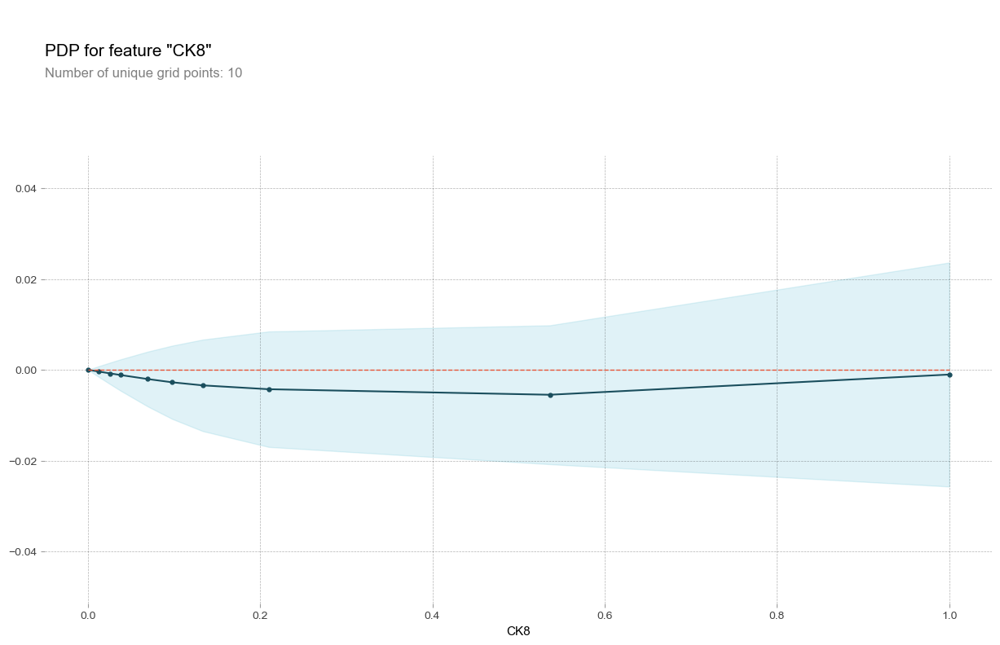

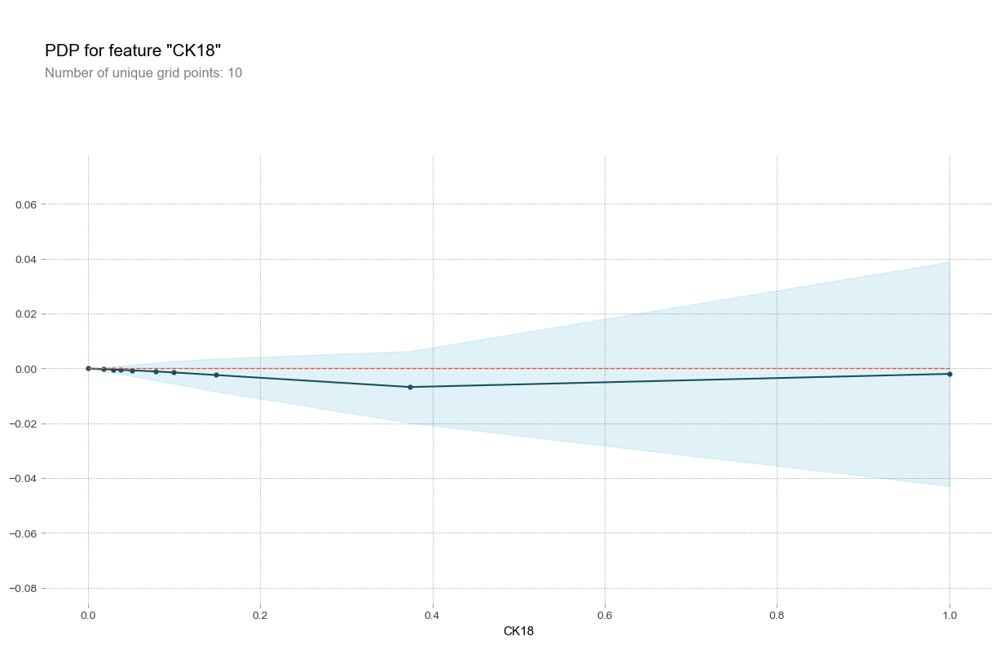

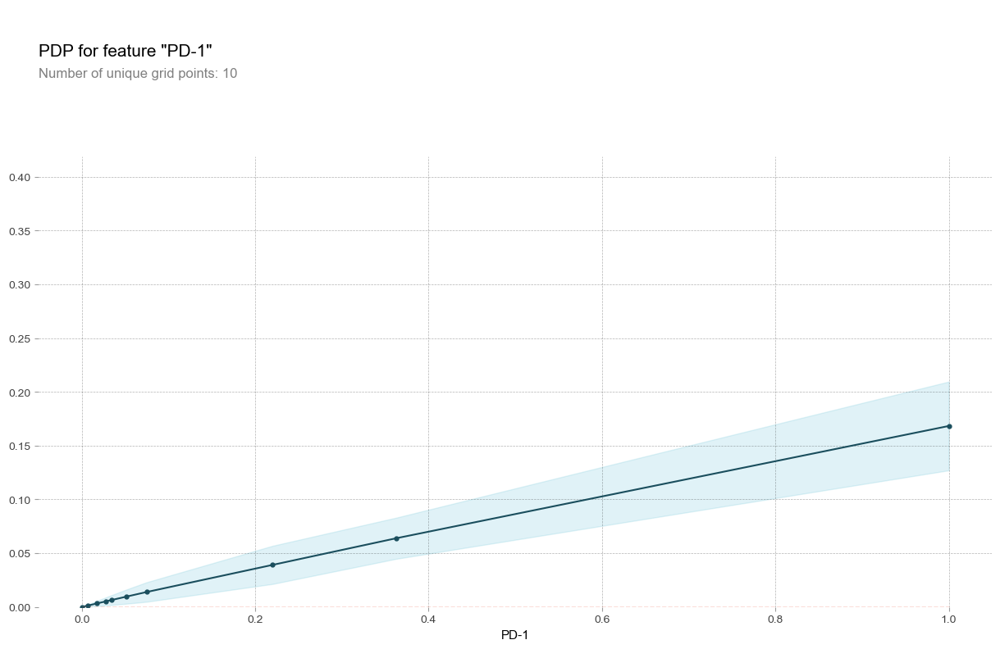

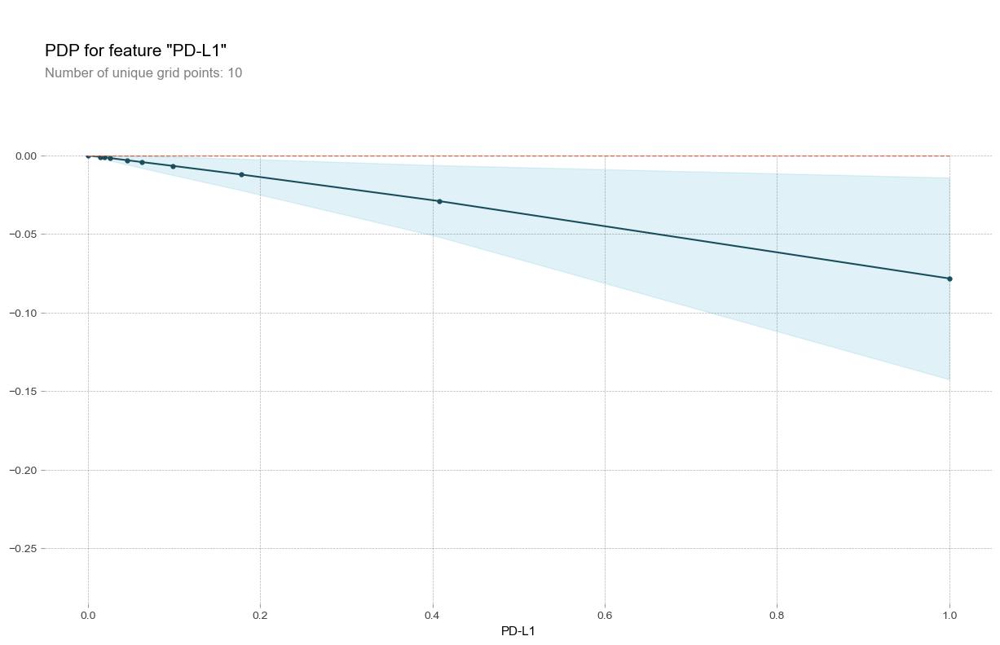

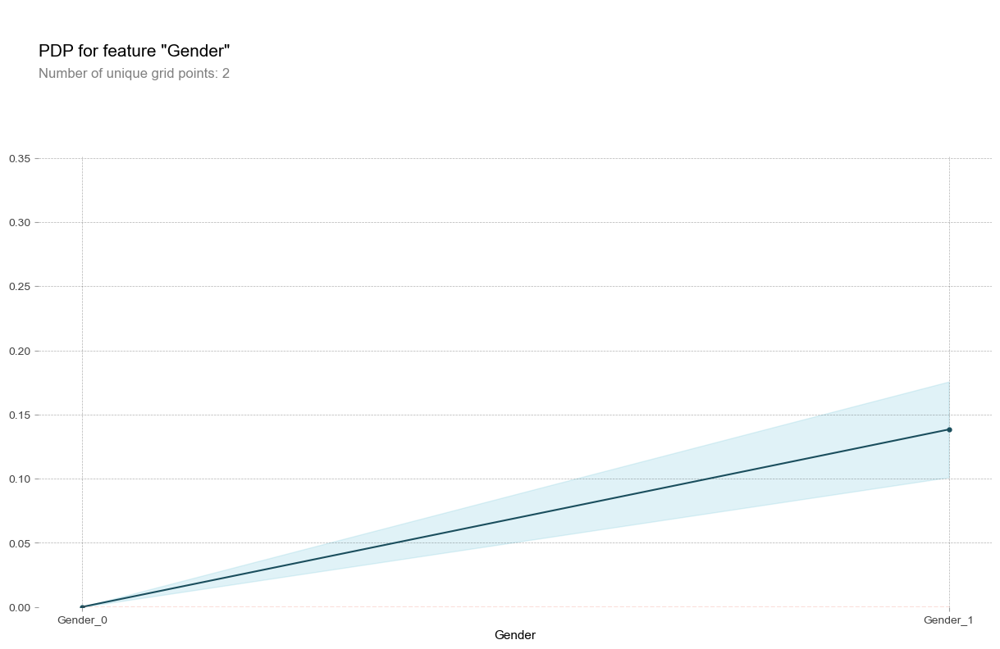

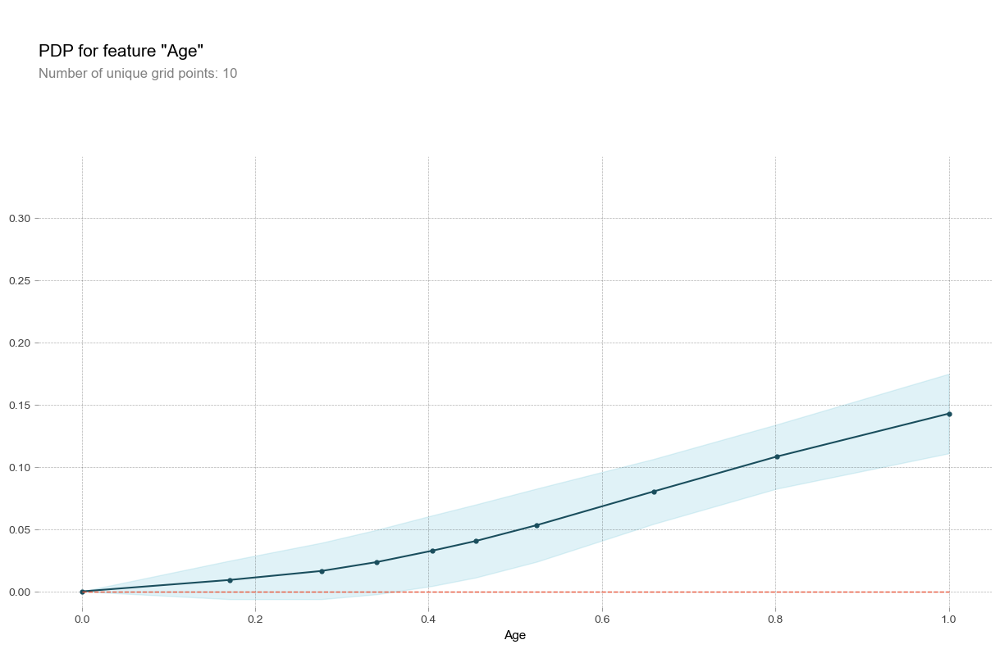

-----------------------------------------------------------------------------------------
X_nn3h 의 fold 2 에 대한 PDPplot


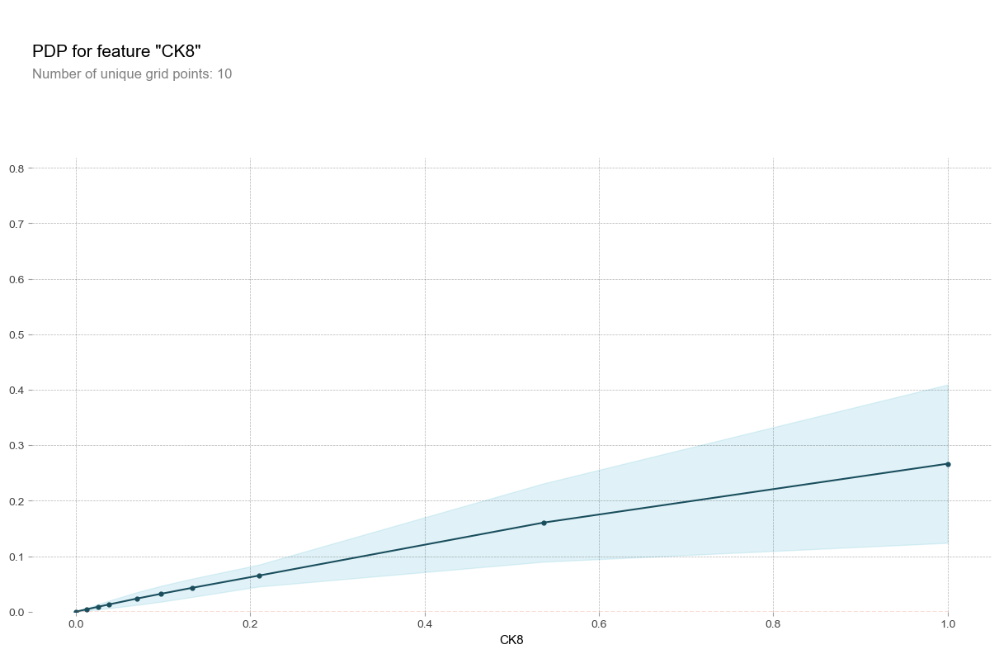

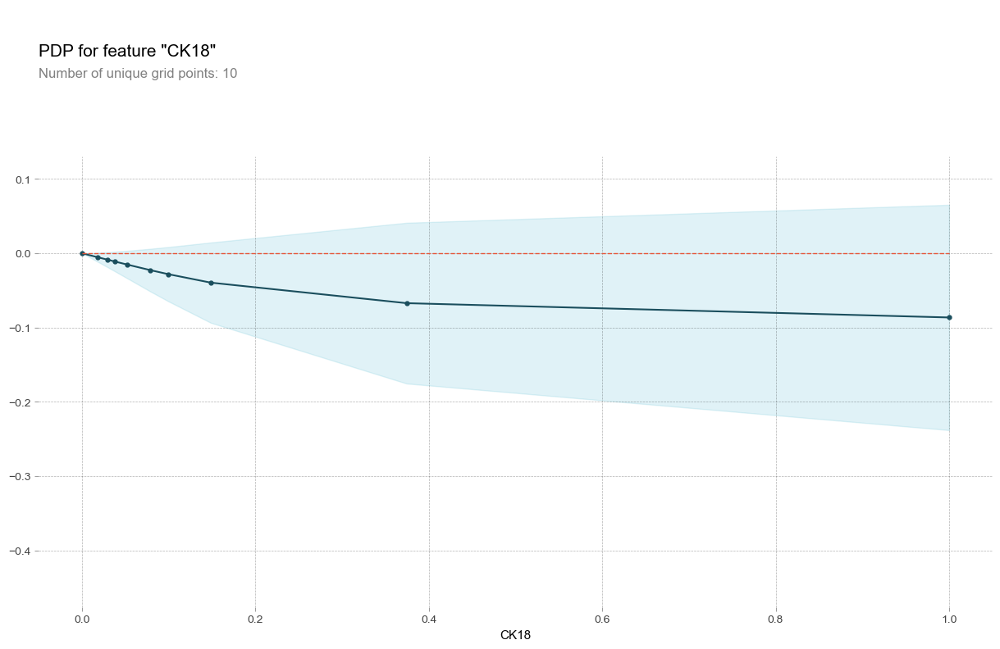

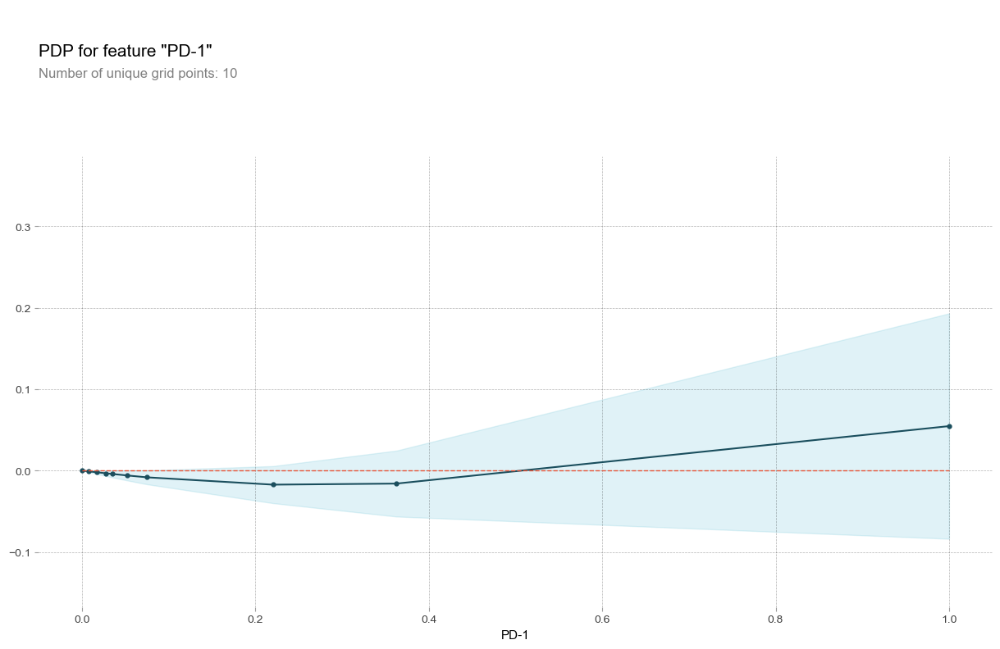

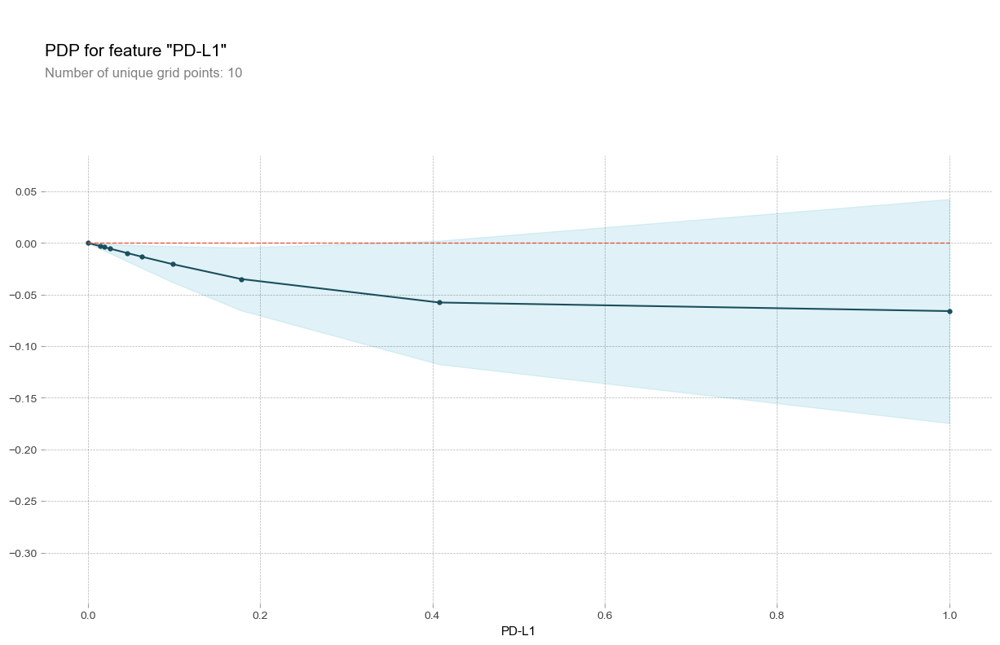

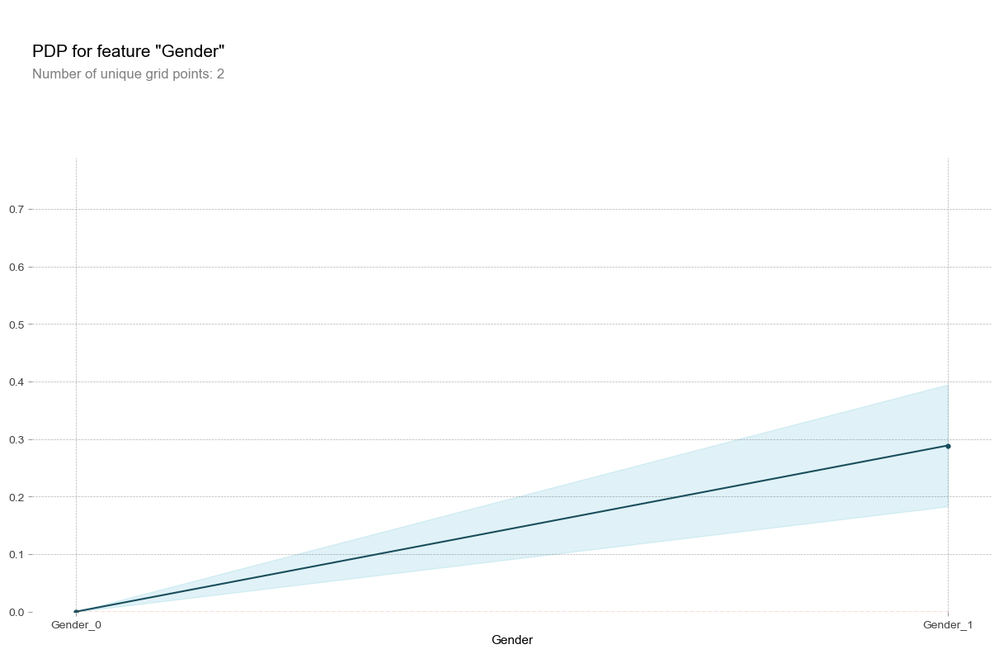

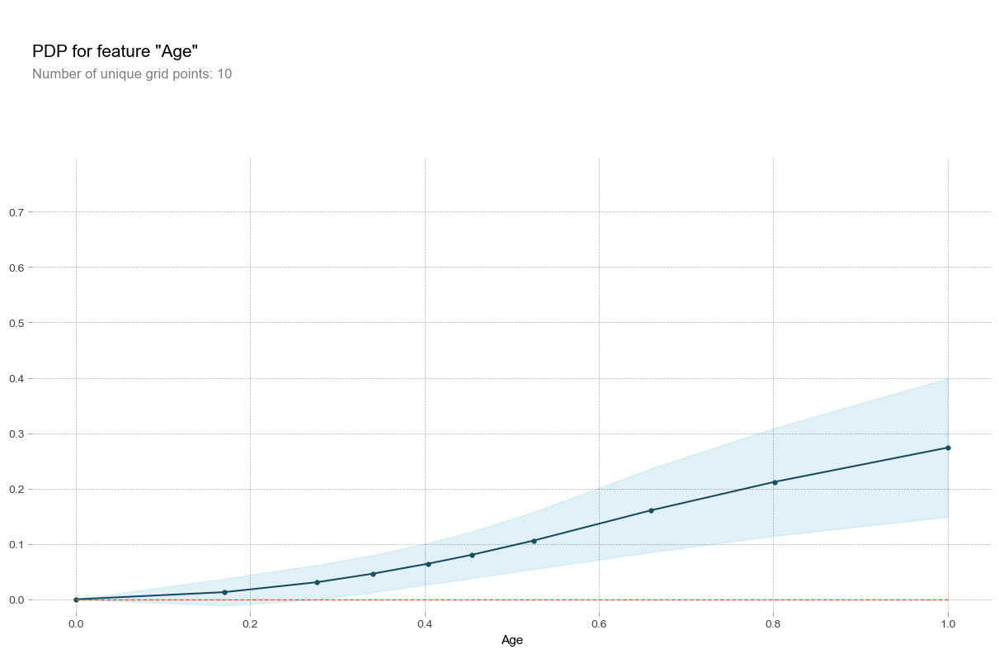

-----------------------------------------------------------------------------------------
X_nn3h 의 fold 3 에 대한 PDPplot


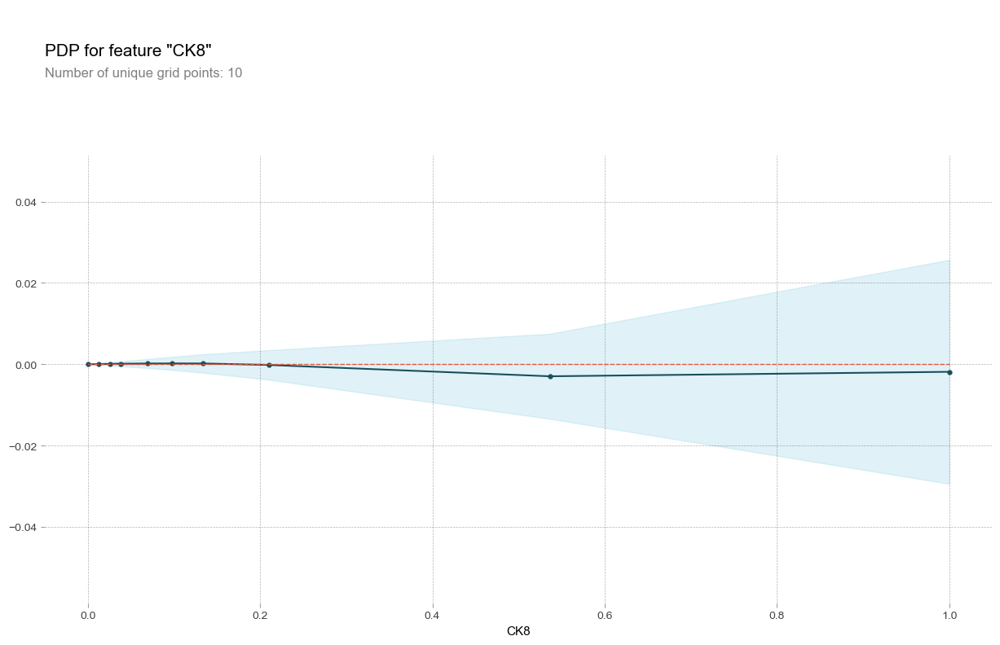

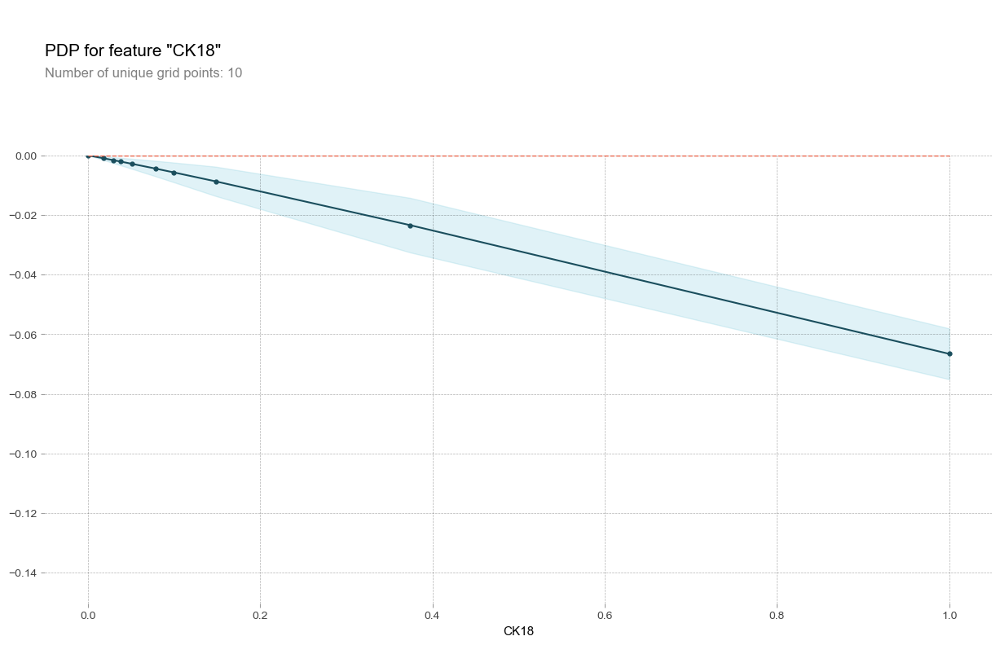

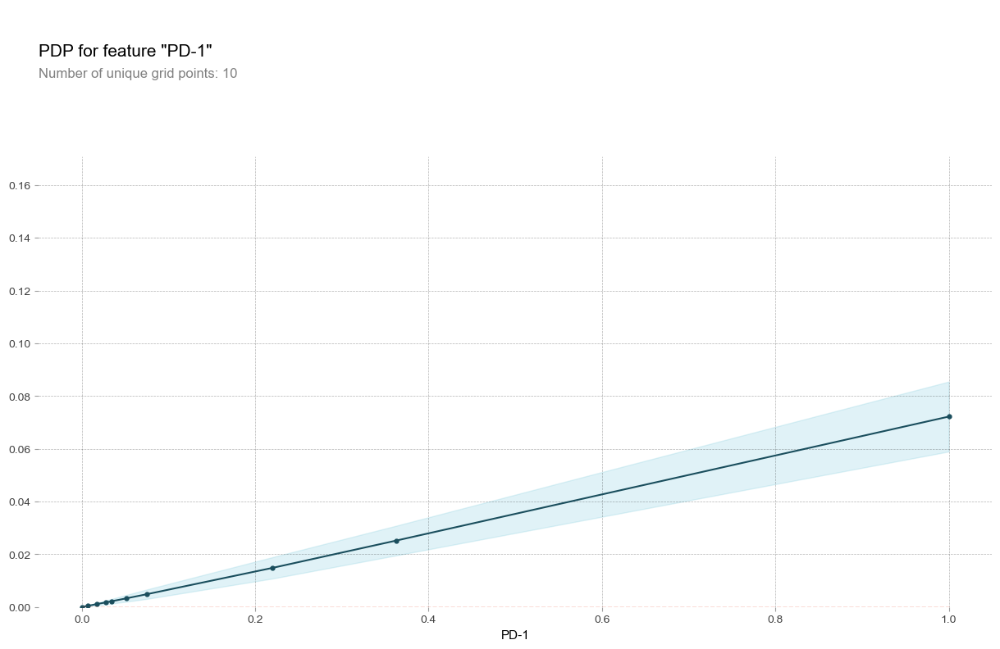

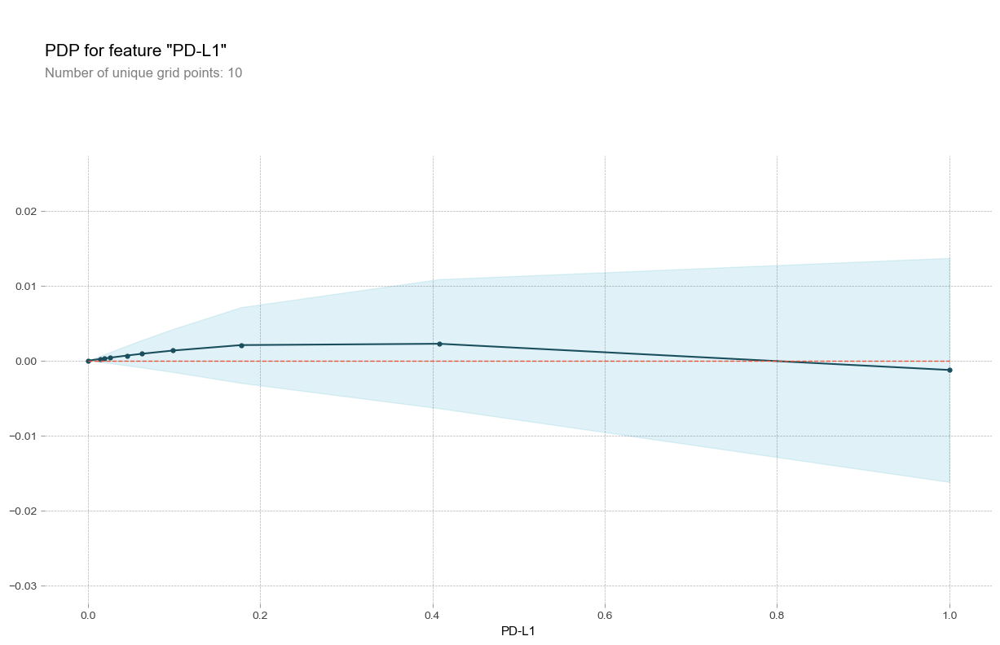

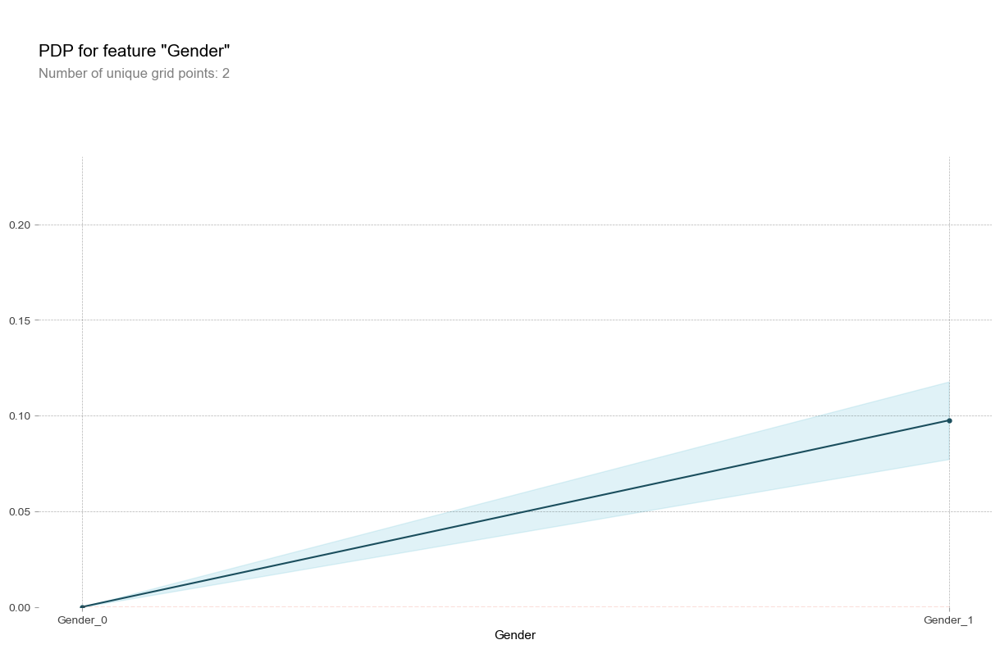

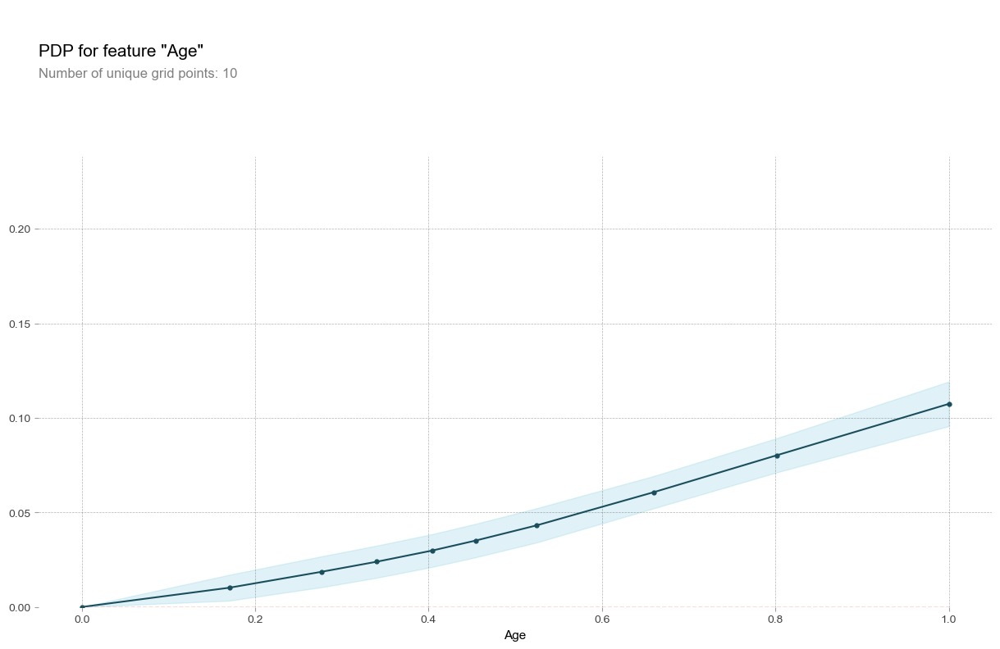

-----------------------------------------------------------------------------------------
X_nn3h 의 fold 4 에 대한 PDPplot


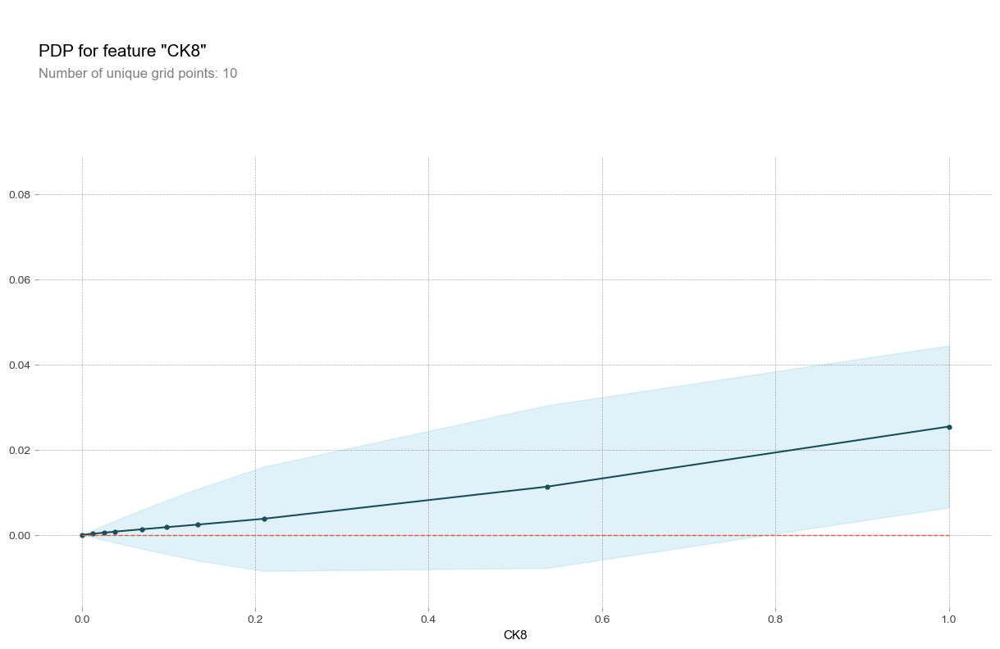

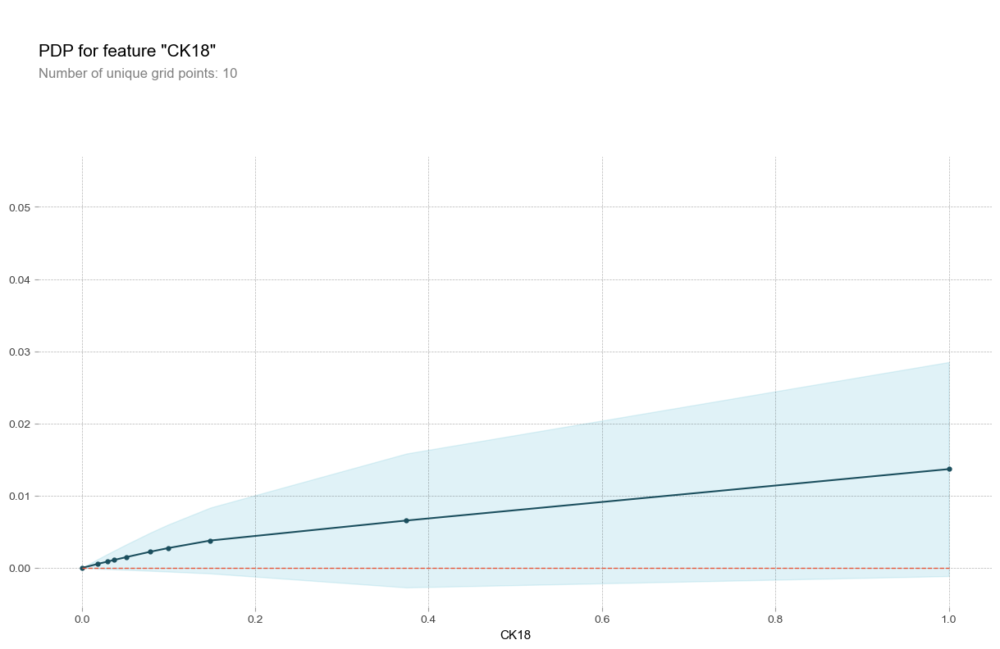

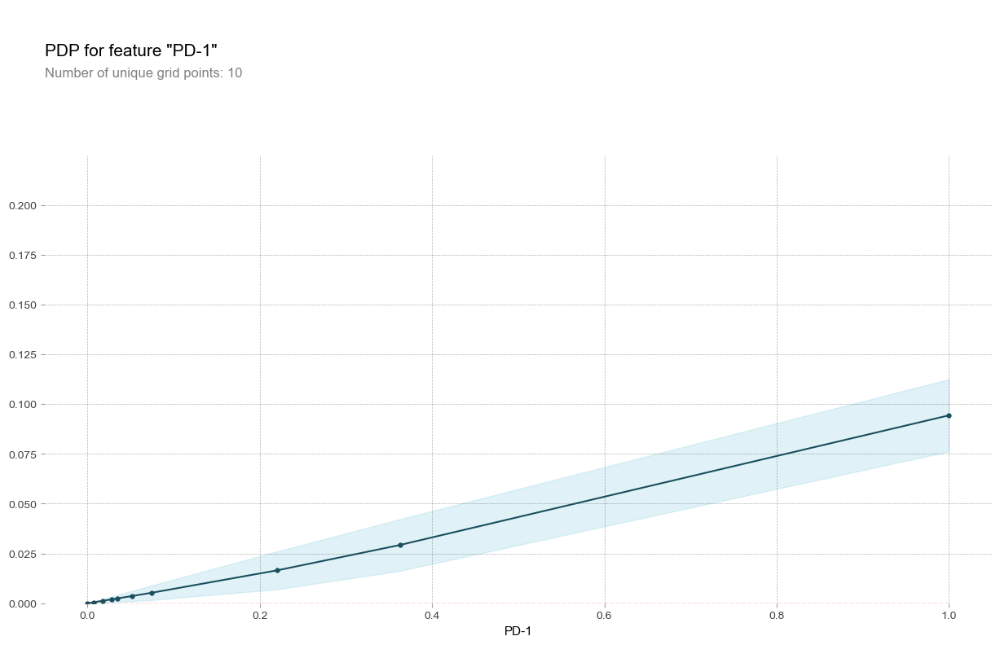

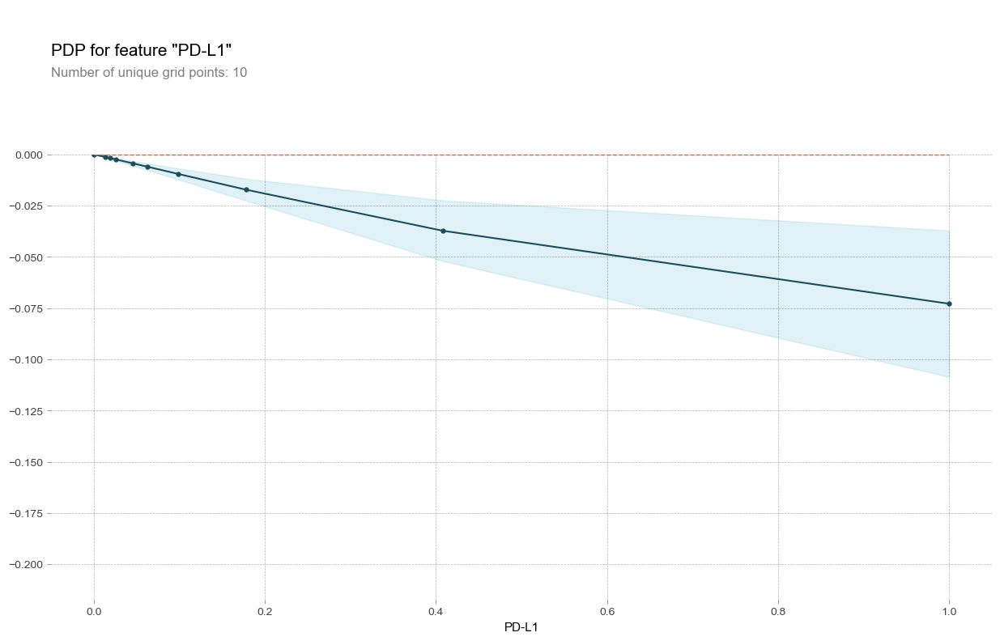

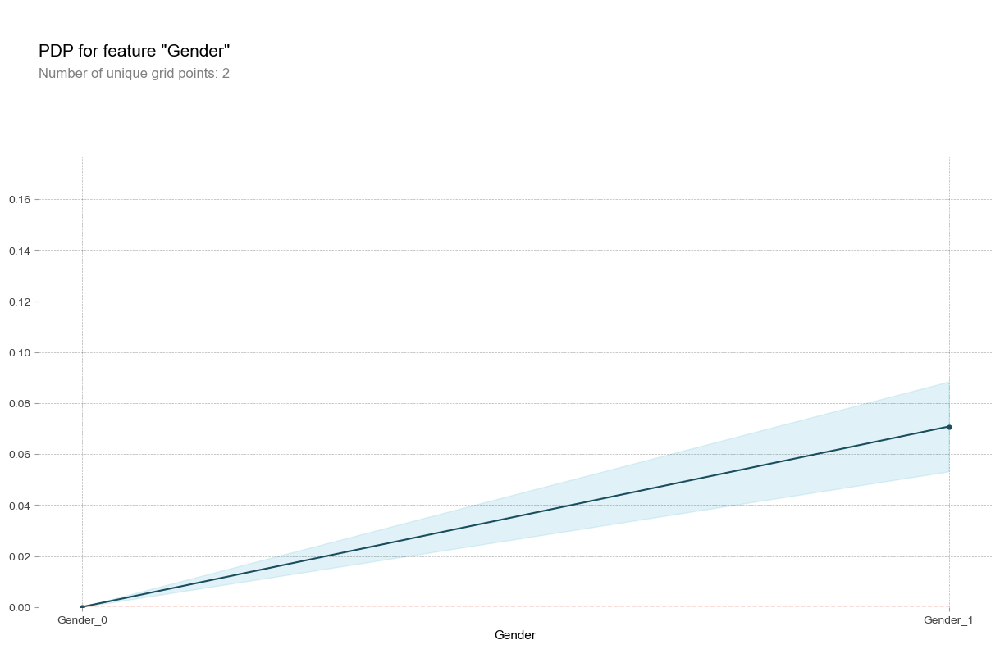

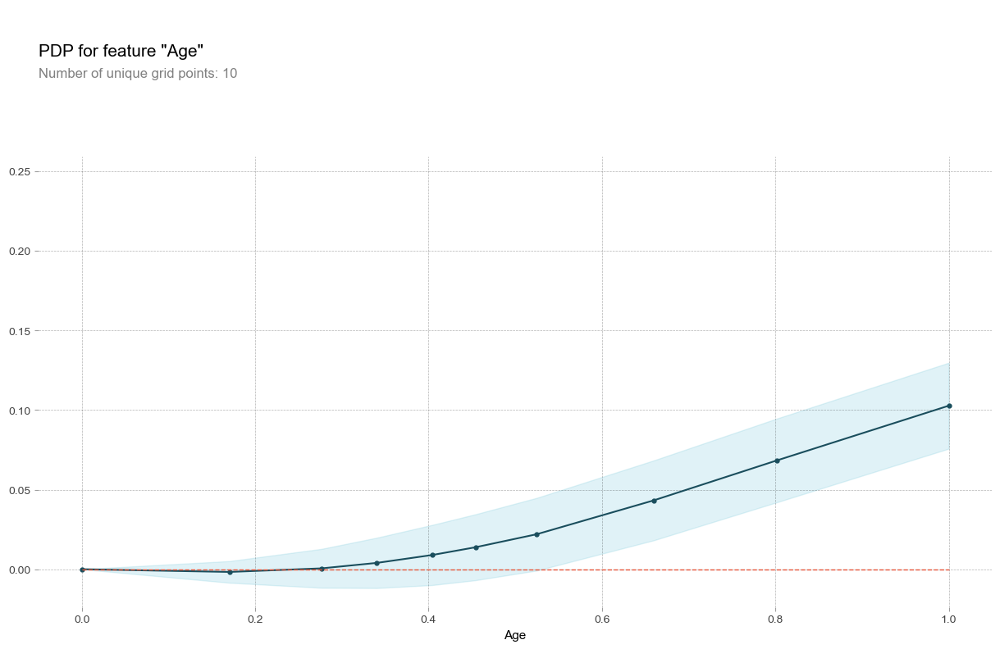

-----------------------------------------------------------------------------------------
X_nn3h 의 fold 5 에 대한 PDPplot


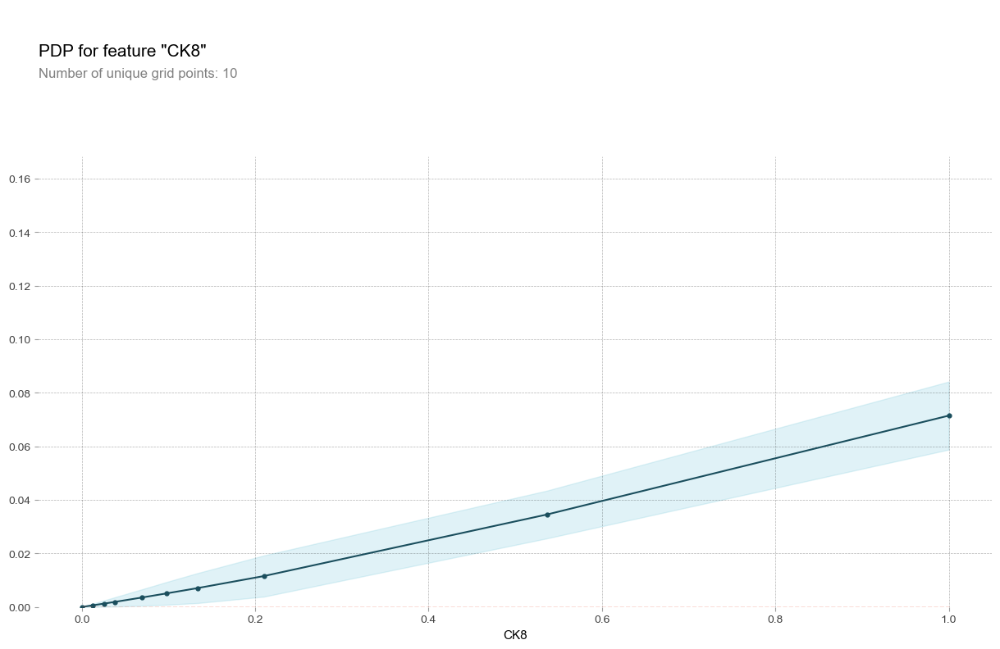

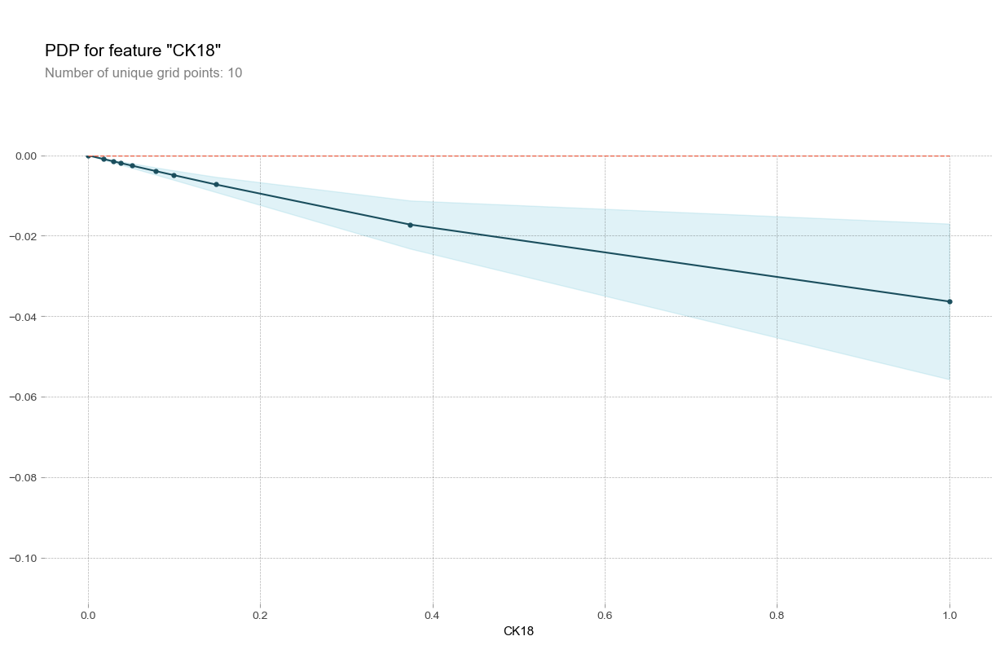

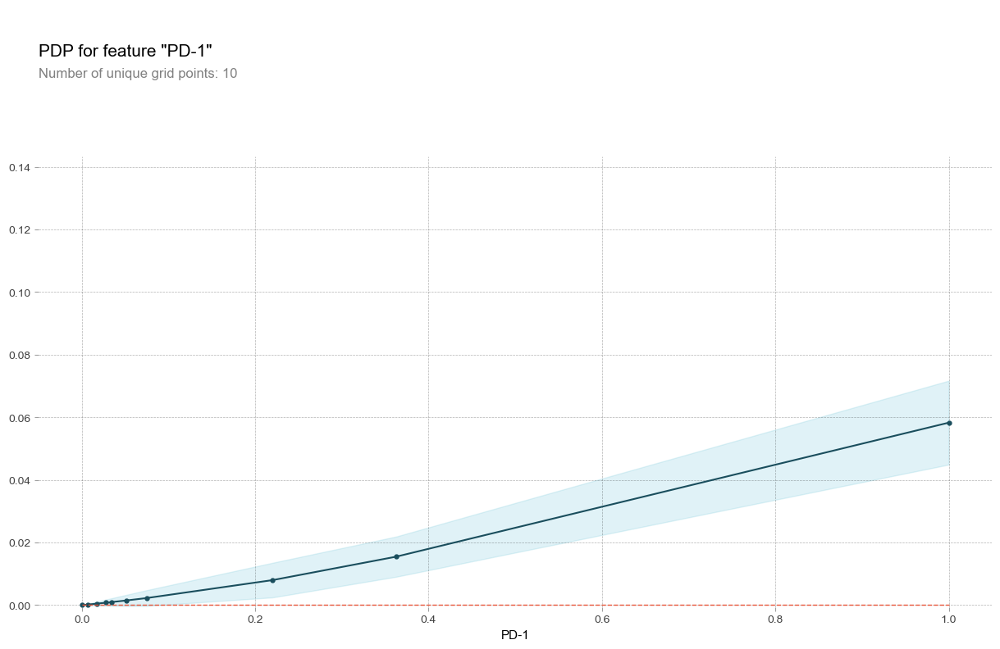

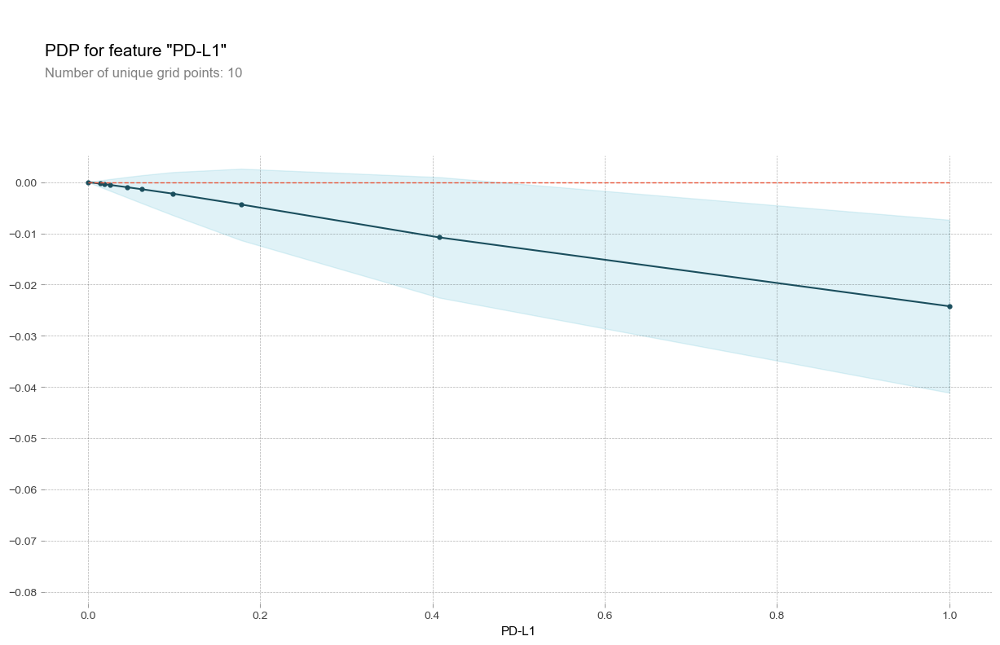

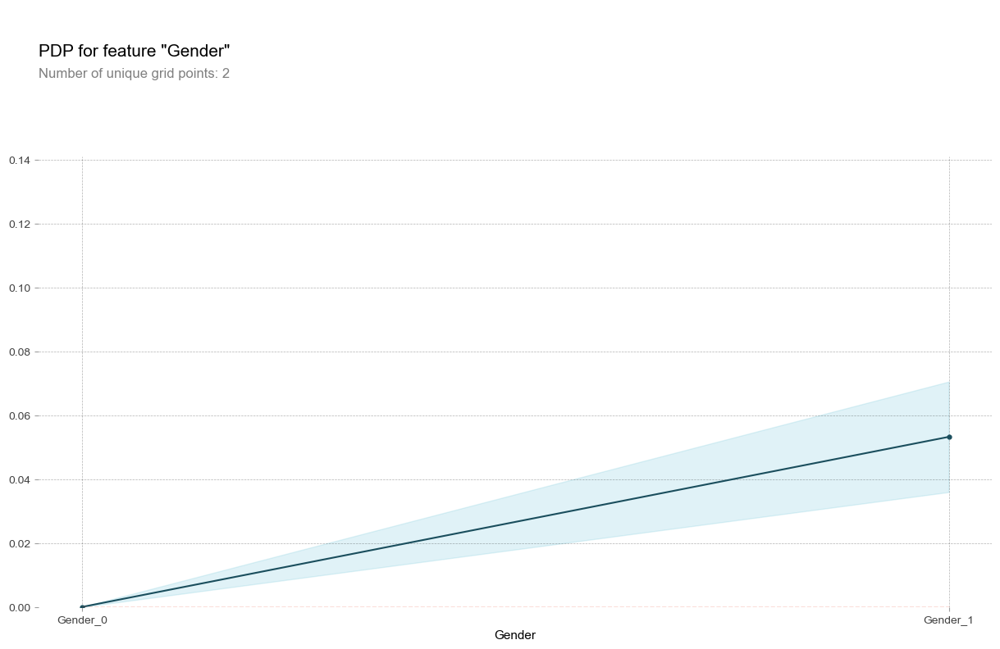

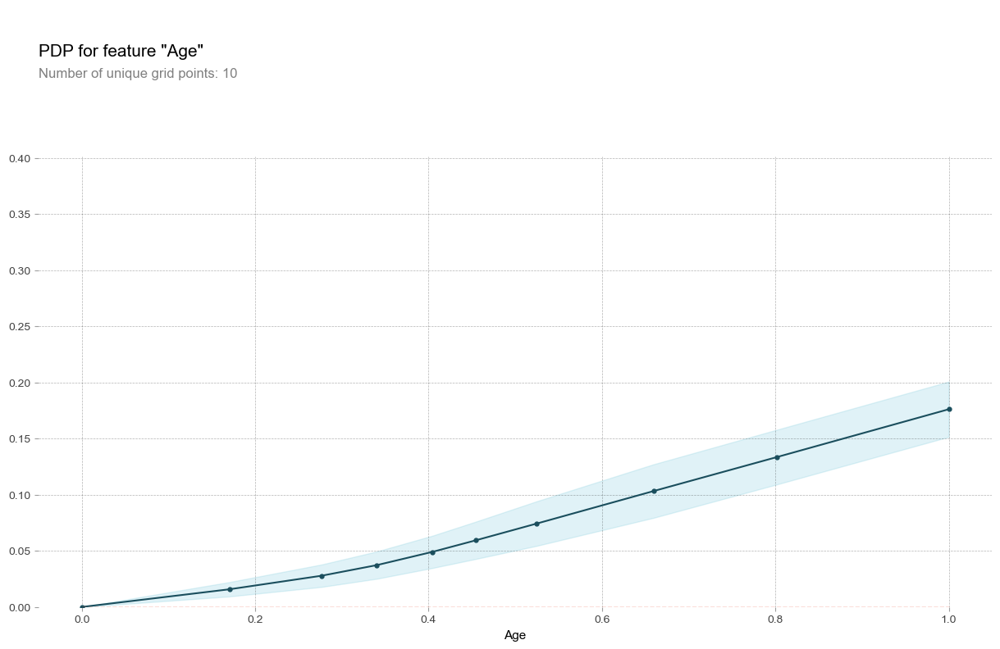

In [16]:
from pdpbox import pdp
import pandas as pd

for i in range(num_sets):
    model = Sequential()
    model.add(Dense(1024, input_dim=X_norm_sets[i].shape[1], activation='relu'))  # 입력 차원을 해당 데이터셋에 맞게 설정
    model.add(BatchNormalization())
    model.add(Dense(512, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dense(64,activation='relu'))
    model.add(Dense(1, activation='sigmoid'))

    
    print('-----------------------------------------------------------------------------------------')
    print(X_dataset_names[i],'에 대한 PDPplot')
    
    for j in range(5):
        model.load_weights(f"./nn3h_model_relu_2h/{X_dataset_names[i]}_fold{j+1}.hdf5")
        print('-----------------------------------------------------------------------------------------')
        print(X_dataset_names[i],'의 fold',j+1,'에 대한 PDPplot')
        
        for k in range(len(col_name_sets[i])):
            pdp_goals = pdp.pdp_isolate(model=model, dataset=X_norm_sets[i], 
                                        model_features=X_norm_sets[i].columns.tolist(),feature=col_name_sets[i][k])
        
            # Create a DataFrame from the data stored in the pdp_goals object
            df_pdp = pd.DataFrame({'feature_values': pdp_goals.feature_grids, 'partial_dependence': pdp_goals.pdp})

            # To save it as csv file:
            df_pdp.to_csv(f'./nn3h_pdp/{X_dataset_names[i]}_fold{j+1}_{col_name_sets[i][k]}.csv', index=False)

            # PDP 그리기
            pdp.pdp_plot(pdp_goals, col_name_sets[i][k])
            plt.show()
